# Introduction

## I Part of Master thesis 
## Vision and Perception Homework

In recent years, the number of forest fires has been growing rapidly, and one of the possible solutions is the use of unmanned aerial vehicles for early detection of fires. This project is a continuation of my bachelor's thesis. Initially, I studied aerospace engineering, and my bachelor's project was related to a long-range unmanned aerial vehicle, the main purpose of which was to ensure safety. Therefore, with the help of this project, I would like to increase the capabilities of this drone. In addition, I decided to expand this problem and make it also my master's thesis. This is the first part, and here I will focus on creating an accurate image classifier. The goal of the second part will be to create an object detection algorithm that will be able to identify smoke and fire with an accuracy above 82%. As a benchmark for me is the project of an [A Vision-Based System for Early Fire Detection](https://www.researchgate.net/publication/247161941_A_Vision-Based_System_for_Early_Fire_Detection)


## Descriptive purpose of the project
The main goal of this project is to create a multi-class or binary classifier for early fire detection. The neural network must be able to classify images into at least two classes: **Fire** and **No Fire**. The last class contains images without any smoke or fire. In an ideal world, my model should also recognize the **Smoke** class, however, the data presented in the first dataset is  synthetic and this can be very difficult and almost impossible. Since there were no images without fire in the [First dataset](https://www.kaggle.com/code/gpiosenka/smoke-fire-f1-score-99-9/data), I used additional data from the following two datasets:[Second dataset](https://www.kaggle.com/datasets/atulyakumar98/test-dataset?resource=download#), [Third dataset](https://www.kaggle.com/datasets/cristiancristancho/forest-fire-image-dataset)

# 1 Setup

In [ ]:
%%capture
!pip install imagehash
!pip install torchmetrics

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
# Data analysis and calculation
import os
import numpy as np
import pandas as pd
from typing import List, Callable, Dict
import functions

# Data visualization
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import seaborn as sns
import cv2
from PIL import Image
import imagehash
plt.rcParams["figure.dpi"] = 200

# Machine learning prediction
import torch
import torch.nn.functional as F
from torch.autograd import Variable
from torch import nn
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.optim.lr_scheduler import _LRScheduler
from torch.utils.data import DataLoader, Dataset
from torch import topk

from torchvision import transforms as T
import torchvision.datasets as datasets
import torchvision.models as models
from torchvision.transforms.transforms import Resize
from torchmetrics.functional import accuracy
from torchvision import models, transforms


from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Keras and TensorFlow
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array 
from tensorflow.keras.applications.resnet50 import preprocess_input 
from tensorflow.keras.preprocessing import image

# models 
from keras.models import Model

import copy
from collections import namedtuple
import os
import random
import shutil
import time
import io

# 2 EDA and Data Preparation

## 2.1 Dataframe creation


In this part, I will create a new data frame that will contain two columns "Path" and "Label". I will also study classes.

In [ ]:
filepaths=[]
labels=[]

fire_dir=r'/content/gdrive/MyDrive/Fire_data/train/fire'
none_dir=r'/content/gdrive/MyDrive/Fire_data/train/none'

for d in [fire_dir, none_dir]:
    flist=os.listdir(d)
    for f in flist:
        fpath=os.path.join(d,f)
        filepaths.append(fpath)

        if d== none_dir:
            labels.append('none')
        else:
            labels.append('fire')
            
print ('filepaths: ', len(filepaths), '   labels: ', len(labels))

filepaths:  10643    labels:  10643


* We have 10,643 images of two categories: **Fire** and **Not Fire**

In [105]:
fire_df = pd.DataFrame(columns=["path","label"])
fire_df = images_to_df(fire_df, "train/fire", "train/none")
fire_df.head()

,path,label
0,/content/gdrive/MyDrive/Fire_data/train/none/n...,none
1,/content/gdrive/MyDrive/Fire_data/train/fire/f...,fire
2,/content/gdrive/MyDrive/Fire_data/train/none/n...,none
3,/content/gdrive/MyDrive/Fire_data/train/none/n...,none
4,/content/gdrive/MyDrive/Fire_data/train/fire/f...,fire


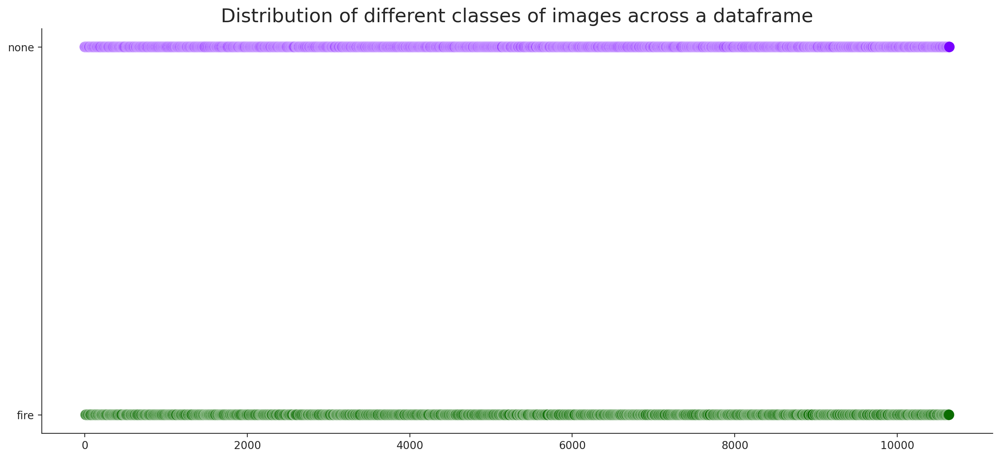

In [ ]:
scatt_plot(fire_df, fire_df.index, "label", "label", "Distribution of different classes of images across a dataframe")

From plot:

* The data is shuffled across the entire dataframe

In [ ]:
fire_df['label'].value_counts()

none    7123
fire    3520
Name: label, dtype: int64

* Obviously, we have a very unbalanced data set and there are several solutions how we can solve such a problem:

  * Downsampling - it is one of the esiest techniques, however in such case we may lose unique and importan samples
  * Oversampling - or augmenting entries from the minority classes to match the quantity of the majority classes. This may be performed several ways, such as by generating synthetic data or by essentially copying entries from the minority class. The main disadvantage is overfitting.
  * Change class weight - in this case, we can change the weight of minority classes. One of common method is to change the weight by the difference between the majority and minority class, however, sometimes this is not always the best value. Better values could be found during hyper parameter tuning.

In this project, I will start with the simplest first technique, but if the results do not satisfy me, I will use more complex methods.

## 2.2 Understand the data set

In this section, I will examine the dataset to understand what type of images I have, and also try to find outliers in **Fire** class. Finally, I will also try to find duplicates.

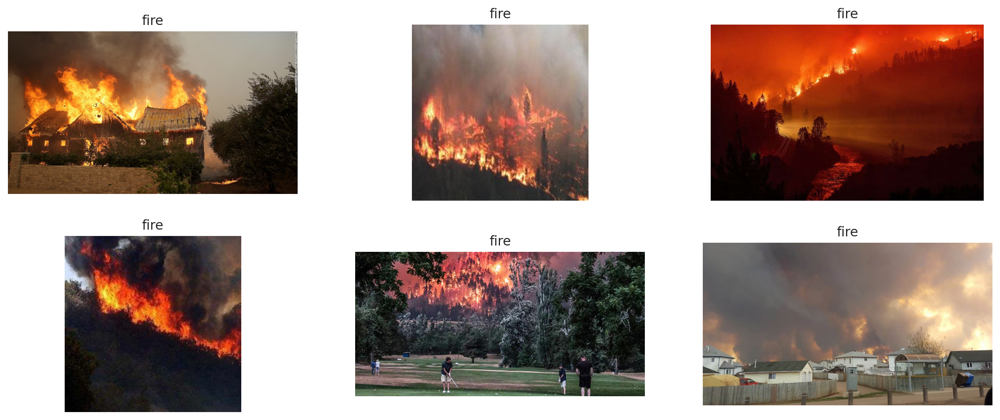

In [ ]:
plot_images('fire', 6)

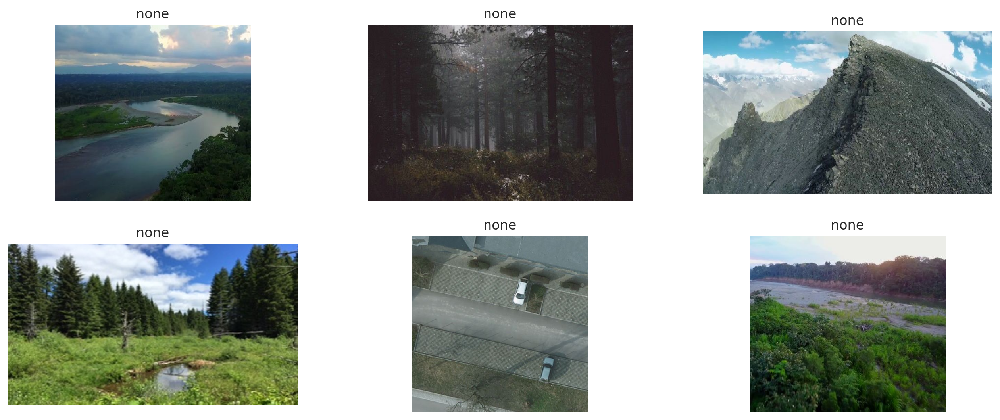

In [ ]:
plot_images('none', 6)

Insights:

* It looks like that fire dataset contains images with smoke and without fire. For the time being I will keep them.
* Some **None Fire** images contains fog which can have impact on classification.


## 2.2 Searching for outliers

An idea how to find outliers I have found in [MR_KNOWNOTHING work](https://www.kaggle.com/code/tanulsingh077/how-to-become-leaf-doctor-with-deep-learning). 
Basically by clustering the data, you can probably form a cluster that will contain outliers.

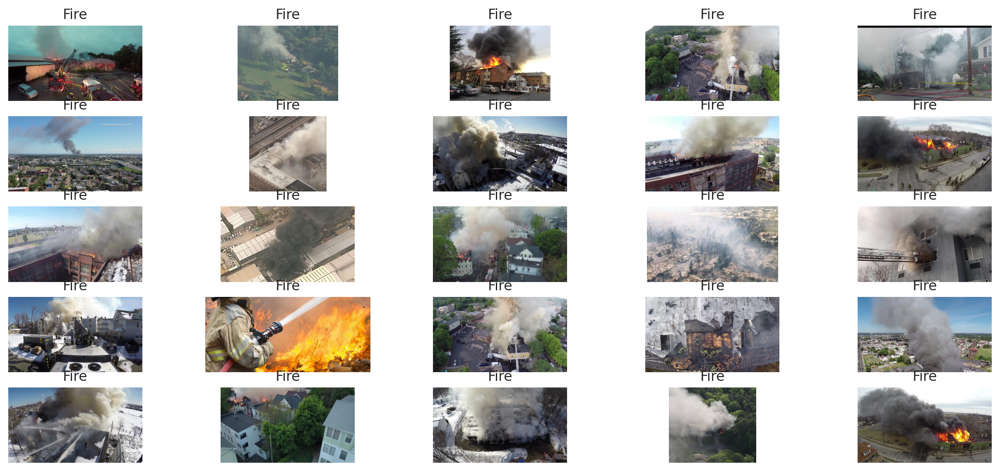

In [ ]:
clust = kmean_clust(fire_df, "fire")
clust_plot(clust, 2)

* In the fourth cluster, there were images with a lot of smoke. We cannot call each image an outlier, because fire is usually accompanied by smoke. It also highlights why classification is not very useful for fire detection because the object detection algorithm can potentially detect both smoke and fire separately.
* For now I will keep every image

## 2.3 Data transformation and augmentation

In this part, I will resize the data and perform a data augmentation by rotating and flipping the images.

In [ ]:
file_count = 3520
samples = []
for category in fire_df['label'].unique():    
    category_slice = fire_df.query("label == @category")    
    samples.append(category_slice.sample(file_count, replace=True,random_state=1))
fire_df = pd.concat(samples, axis=0).sample(frac=1.0, random_state=1).reset_index(drop=True)
print(fire_df['label'].value_counts())
print(len(fire_df))

fire    3520
none    3520
Name: label, dtype: int64
7040


In [ ]:
train_df, valid_df = train_test_split(
    fire_df, train_size=0.8, random_state=42, stratify=fire_df.label.values
)

In [ ]:
map = {
    0: "none",
    1: "fire"
}
fire_map = {item: key for key, item in map.items()}

In [ ]:
class ConvertData(Dataset):
    def __init__(
        self,
        data: List[str],
        labels: List[int],
        num_map: Dict[str, int],
        trans: Callable,
    ):
        self.data = data
        self.labels = labels
        self.num_map = num_map
        self.trans = trans

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, ix: int):
        "Resizes image"
        image = cv2.imread(self.data[ix])
        image = cv2.resize(image, (224, 224))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = self.labels[ix]
        return image, label

    def image_trans(self, image: np.ndarray):
        image = torch.tensor(image / 255.0).permute(2, 0, 1)
        image = self.trans(image)
        return image

    def label_trans(self, label: str):
        code = self.num_map[label]
        return F.one_hot(torch.tensor(code), len(self.num_map))

    def collate_fn(self, batch):
        "Prepears image for network"
        images, labels = [], []
        for img, lab in batch:
            images.append(self.image_trans(img))
            labels.append(self.label_trans(lab))
        return torch.stack(images).float(), torch.stack(labels).float()

In [ ]:
train_trans = T.Compose(
    [  
        T.RandomVerticalFlip(),
        T.RandomPerspective(0.25),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)
val_trans = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [ ]:
BATCH_SIZE = 32

train_set = ConvertData(train_df['path'].to_list(), train_df['label'].to_list(), fire_map, train_trans)
train_loader = DataLoader(
    train_set,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True,
    pin_memory=True,
    num_workers=4,
    collate_fn=train_set.collate_fn,
)

eval_set = ConvertData(valid_df['path'].to_list(), valid_df['label'].to_list(), fire_map, val_trans)
eval_loader = DataLoader(
    eval_set,
    batch_size=BATCH_SIZE,
    num_workers=4,
    pin_memory=True,
    collate_fn=eval_set.collate_fn,
)

* The training and validation data has been transformed, modified, flipped and normalized
* In addition, I have prepared two data loaders

# 3 Model

In [71]:
class Resnet(nn.Module):
    """
    Takes pretrained layers and
    adds additional on top
    """

    def __init__(self, base: nn.Module, num_classes: int):
        super().__init__()

        self.base = nn.Sequential(*list(base.children())[:-1], nn.Flatten())
        self.head = nn.Sequential(
            nn.Linear(base.fc.in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(512, num_classes),
        )

    def forward(self, data: torch.tensor):
        preds = self.head(self.base(data))
        return preds

In [72]:
resnet18= models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
model18 = Resnet(resnet18, 2)

* After several attempts and comparisons, I chose **Resnet 18**, because I think that **Resnet 34** is too deep, and the model tends to overfit 

In [73]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


# 4 Training and Results

## 4.1 Model training

In this project, two metrics are important to me **Accuracy** and **Recall**. During the training phase, I will use **Accuracy** to determine overfitting or underfitting. In the classification report, the **Recall** will be the most important.

In [74]:
EPOCHS = 25

In [75]:
class EarlyStopping():
    def __init__(self, tolerance=5, delta=0):

        self.tolerance = tolerance
        self.delta = delta
        self.counter = 0
        self.early_stop = False

    def __call__(self, train_loss, validation_loss):
        if (validation_loss - train_loss) > self.min_delta:
            self.counter +=1
            if self.counter >= self.tolerance:  
                self.early_stop = True

In [76]:
class Trainer():
  def __init__(self, model: nn.Module, train_iter: train_loader, val_iter):
   self.model = model
   self.train_iter = train_iter
   self.val_iter = val_iter

  def forward(self, input: torch.tensor):
        return self.model(input)

  def config_optimizer(self):
    params = [
        {"params": self.model.base.parameters(), "lr": 3e-5},
        {"params": self.model.head.parameters(), "lr": 1e-6}
    ]
    optimizer = torch.optim.Adam(params=params)
    scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, 
      milestones=[4, 10], gamma=0.1)
    
    return optimizer, scheduler

  def train(self, optimizer, scheduler):
    
    self.model.train()
    t_loss = 0.0
    t_acc = 0.0
    
    for i, data in enumerate(self.train_iter):
      inputs, labels = data
      inputs = inputs.to(device)
      labels = torch.tensor(labels)
      labels = labels.to(device)

      
      optimizer.zero_grad()
      outputs = self.model(inputs)

      loss =  F.cross_entropy(outputs, labels)
      acc = accuracy(outputs.argmax(dim=1), labels.argmax(dim=1)).item()

      t_acc += acc
      
      loss.backward()
      optimizer.step()
      scheduler.step()

 
      t_loss += loss.item()

    return t_loss/len(self.train_iter), (t_acc / len(self.train_iter))*100
  
  def val(self):

    v_loss = 0.0
    v_acc = 0.0
    pred_labels = []
    t_labels = []
    self.model.eval()

    with torch.no_grad():
      for i, data in enumerate(self.val_iter):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = torch.tensor(labels)
        labels = labels.to(device)

        outputs = self.model(inputs)
        loss =  F.cross_entropy(outputs, labels)
        v_loss += loss.item()

        acc = accuracy(outputs.argmax(dim=1), labels.argmax(dim=1)).item()
        v_acc += acc


      return v_loss/len(self.val_iter), (v_acc/len(self.val_iter))*100, pred_labels, t_labels

    
  def result(self, epochs: int):
    
    torch.cuda.empty_cache()
    
    best_acc = 0.0
    best_loss = 1
    

    train_loss = []
    train_acc = []
    val_loss = []
    val_acc = []
    true_label = []
    pred_label = []
    lrs = []
    
    e_stop = EarlyStopping(3, 10)

    optimizer, scheduler = self.config_optimizer()

    for epoch in range(epochs):

      print("Epoch: {}/{}".format(epoch+1, epochs))
      print("="*10)

      train_epoch_loss, train_epoch_acc = self.train(optimizer, scheduler)
      val_epoch_loss, val_epoch_acc, t_l, p_l = self.val()

      train_loss.append(train_epoch_loss)
      train_acc.append(train_epoch_acc)

      val_loss.append(val_epoch_loss)
      val_acc.append(val_epoch_acc)
      true_label.extend(t_l)
      pred_label.extend(p_l)
      
      optimizer, scheduler = self.config_optimizer()
      
      e_stop(train_epoch_loss, val_epoch_loss)
       
      if val_epoch_loss < best_loss:
          best_loss = val_epoch_loss
          torch.save(self.model.state_dict(), 'my_model.pt')
      
      print("Train Loss = {}".format(round(train_epoch_loss, 4)))
      print("Train Accuracy = {} % \n".format(train_epoch_acc))
      print("Val Loss = {}".format(round(val_epoch_loss, 4)))
      print("Val Accuracy = {} % \n".format(val_epoch_acc))

    return train_loss, train_acc, val_loss, val_acc

In [ ]:
model18 = model18.to(device)
train = Trainer(model18, train_loader, eval_loader)
train_loss, train_acc, val_loss, val_acc = train.result(EPOCHS)

* The training class consists of training, validation and training result and the optimizer. The last mentioned method determined the learning rate for the base and head layers. The training rate is updated twice after 4 and 10 epochs. This method has significantly reduced overfitting
* Model with best validation loss is saved
* In this particular case I have specified in total 25 epochs

## 4.2 Result

In this section I will study the learning outcomes. This will help to understand how loss and accuracy have changed over time.

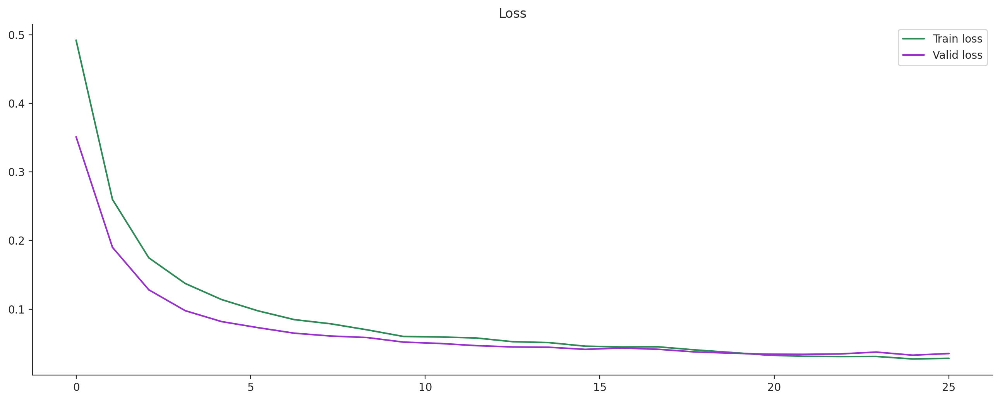

In [78]:
line_plot(train_loss, val_loss, "Loss", ["Train loss", "Valid loss"])

In [ ]:
line_plot(train_acc, val_acc, "")

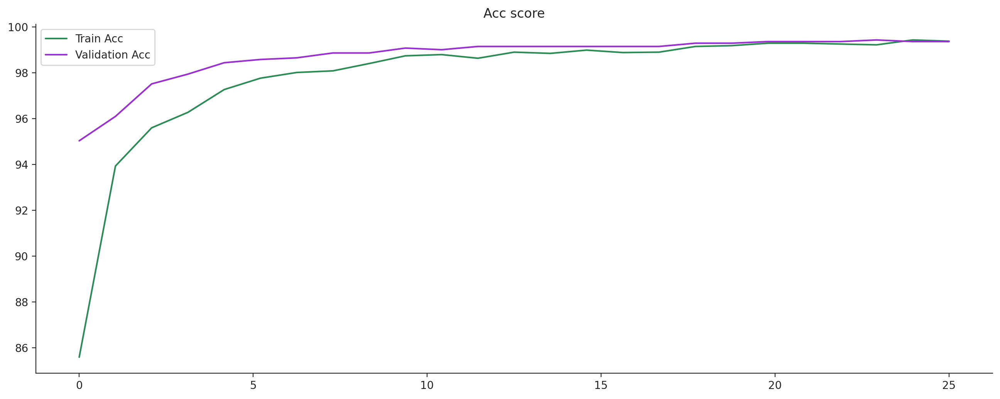

In [79]:
line_plot(train_acc, val_acc, "Acc score", ["Train Acc", "Validation Acc"])

* The loss indicates that at the beginning the model is underfitting, then it stabilizes, but still it is not perfect
* The accuracy graph shows almost the same results

# 5 Testing

## 5.1 Baseline metrics

In this part, I will study the basic metrics of the test set, and also take several random images from the Internet to check how the model performs.

In [ ]:
model18.load_state_dict(torch.load('/content/my_fire_class.pt'))

In [81]:
model18 = model18.to(device)

In [106]:
test_df = pd.DataFrame(columns=["path", "label"])
test_df = images_to_df(test_df, "valid/fire", "valid/none")

* Since we have a balanced training dataset, I have to create a balanced test set

In [83]:
test_set = ConvertData(test_df['path'].to_list(), test_df['label'].to_list(), fire_map, val_trans)
test_loader = DataLoader(
    test_set, batch_size=len(test_df), num_workers=4, collate_fn=test_set.collate_fn
)

In [84]:
def test_model():
    running_correct = 0.0
    running_total = 0.0
    true_labels = []
    pred_labels = []
    incorrect_examples = []
    model18.eval()
    with torch.no_grad():
        for i, data in enumerate(test_loader):
            inputs, labels = data
            inputs = inputs.to(device)
            labels = torch.tensor(labels)
            labels = labels.to(device)
            labels = torch.argmax(labels, dim=1)

            
            for label in labels:
              true_labels.append(label.item())

            outputs = model18(inputs)
            _, preds = torch.max(outputs.data, 1)
            for pred in preds:
              pred_labels.append(pred.item())
            


            running_total += labels.size(0)
            running_correct += (preds == labels).sum().item()
            
        acc = running_correct/running_total
    return true_labels, pred_labels, running_correct, running_total, acc

In [ ]:
true_labels, pred_labels, running_correct, running_total, acc = test_model()

### 5.1.1 Confusion matrix

In this section I will study the miss classifications of my model

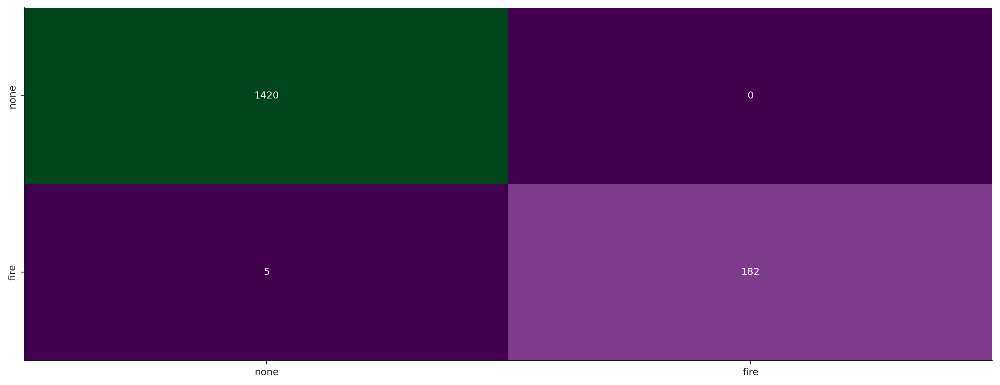

In [101]:
conf_matrix(true_labels, pred_labels)

* There are zero false negaatives results and 5 false positives ones. We can conclude that the module perfectly recognizes fire. In the further part, I will examine the misclassified data.

### 5.1.2 Classification report

In [87]:
print(classification_report(true_labels, pred_labels))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1420
           1       1.00      0.97      0.99       187

    accuracy                           1.00      1607
   macro avg       1.00      0.99      0.99      1607
weighted avg       1.00      1.00      1.00      1607



* For us, the most important metric is **Recall**, and it is 0.97 for the fire class. This is important for us because we want to ensure the safety of our forests, and it will be better for us if firefighters arrive at the scene of the fire, rather than not arrive

### 5.1.3 Random photo exprement

In this section I will take a random photo from the Internet and test my model on it

In [ ]:
!curl https://jeonjucity.kr/wp-content/uploads/2017/11/Jeonju-Hanok-Village-7-1.jpg --output predict.jpg
!curl https://data.ibtimes.sg/en/full/19647/mount-mayon.jpg --output second_predict.jpg

0  at confidence score:0.96


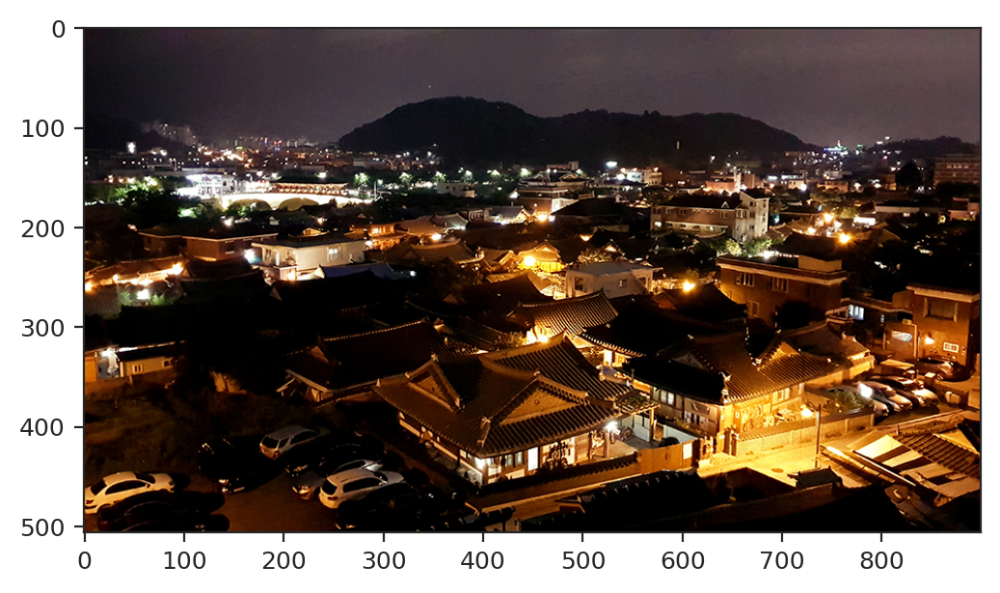

In [89]:
model18.eval()
  
image_path="/content/predict.jpg"
image = plt.imread(image_path)
plt.imshow(image)
 
with open(image_path, 'rb') as f:
    image_bytes = f.read()
 
    conf,y_pre=get_prediction(image_bytes=image_bytes)
    print(y_pre, ' at confidence score:{0:.2f}'.format(conf))

* We can see that with 96% confidence our model predicts that there is no fire in the image

1  at confidence score:0.90


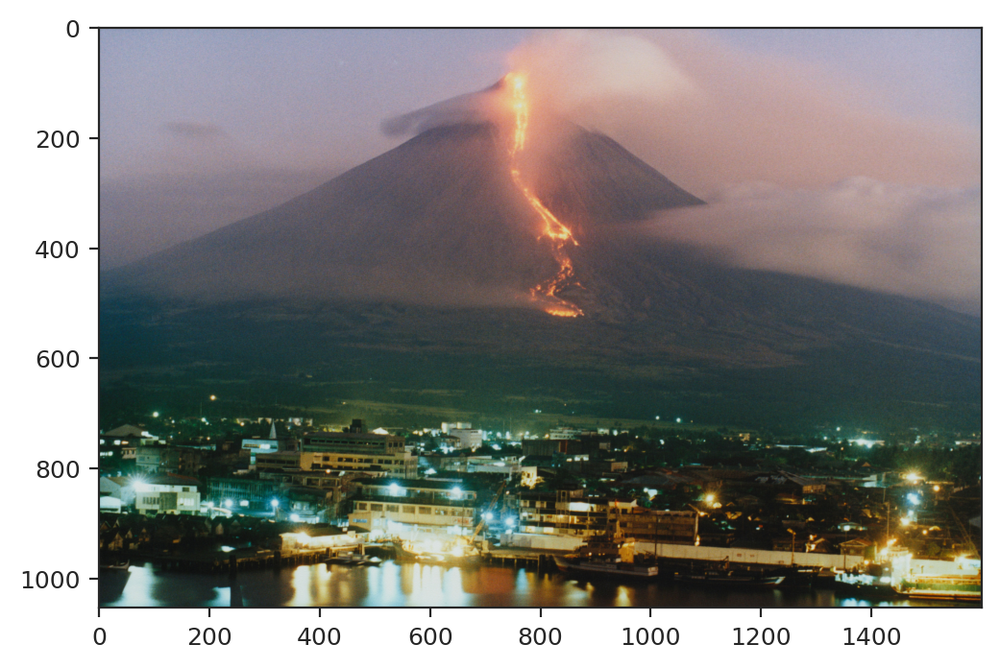

In [ ]:
image_path="/content/second_predict.jpg"
image = plt.imread(image_path)
plt.imshow(image)
 
with open(image_path, 'rb') as f:
    image_bytes = f.read()
 
    conf,y_pre=get_prediction(image_bytes=image_bytes)
    print(y_pre, ' at confidence score:{0:.2f}'.format(conf))

* To prove that it wasn't an accident, I found another image that depicts a night city, but this time it also has a fire/heat source on it. With 90% confidence, the model predicted that there is a fire in this photo.

### 5.1.4 Misclassified images

In this section, I will study misclassified images

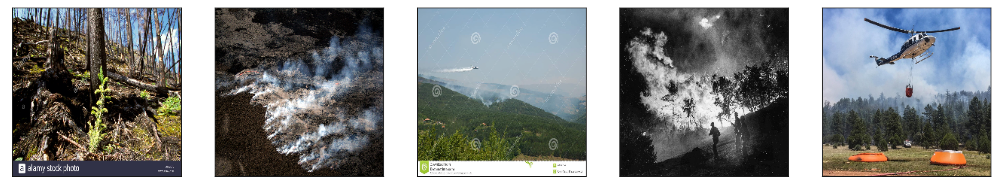

In [93]:
miss_images = missclasified_images(model18)
showimg(miss_images)

* All the misclassified photos, except the first and fourth one, contain smoke, despite the fact that we had a cluster with images of fire that contains smoke, there is no obvious source of fire in these particular images
* The fourth image is black and white, and this may affect the wrong classification
* The first image is actually classified correctly, and it was probably incorrectly placed in the fire images folder

### 5.1.5 Heatmap

The purpose of this section is to check on which parts of the image model focuses, this will help us understand whether the model is remembering or understands the difference between the images.

In [ ]:
new_test_df = test_df.sample(4)

In [ ]:
prepear_heatmap(model18, new_test_df)

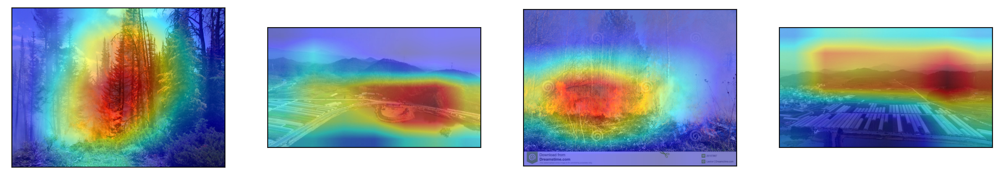

In [ ]:
plot_image_heatmap(4)

* We see that the model in the first and third images focuses specifically on the fire, this may indicate that the model does not make decisions based on the background

# Conclusion

* I have built a model that has **accuracy** of 0,99 on test set and the most important metreic **recall** equal to 0.97 for class 1
* The network incorrectly classified only 5 images out of 1507
* The model accurately predicted the classes of two random images
* The misclassified images are mostly smoke images,one black and white image and one wrongly labeled image
* According to the heat map, the model looks exactly at the place of the fire
* The best technology to reduce overfitting was the learning rate reduction after the 4th and 10th epochs
* I have laid a solid foundation for further work
* Finally, after several attempts, I decided to get rid of the smoke data because they have an average recall value of  0.1. These images were always classified as "none" because the model learned the background environment, but not the smoke. As I expected from the very beginning, the synthetic data was not very good